### Authors : Filippo Prazzoli, Veronica Finazzi, Alessandro Vitriolo 
### Latest Revision Date: 08/01/2025
### License : GPL v3.0

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io

In [2]:
import scvelo as scv

Global seed set to 0


In [3]:
from scipy.sparse import csr_matrix
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import seaborn as sns
from matplotlib import pylab
%matplotlib inline
import igraph as ig
import scanpy.external as sce
import warnings

In [4]:
import harmonypy
import random
import seaborn as sb
import plotly

import celloracle as co
from celloracle import motif_analysis as ma
from celloracle.utility import save_as_pickled_object
from celloracle.applications import Pseudotime_calculator
co.__version__
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import gc
gc.collect()
# check scanpy version
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, dpi_save = 180, transparent = 'False', color_map = 'viridis',fontsize=12)
%matplotlib inline

2025-01-08 15:51:33.634517: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


scanpy==1.10.1 anndata==0.10.5.post1 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==1.5.3 scikit-learn==1.4.2 statsmodels==0.14.2 igraph==0.11.6 louvain==0.8.2 pynndescent==0.5.12


In [5]:
# Inital setting for plot size
from matplotlib import rcParams

FIGSIZE = (4, 4)
rcParams["figure.figsize"] = FIGSIZE

In [6]:
outdir=""
adataOut=""
figuresOut=""


sc.settings.autosave = False
sc.settings.figdir = figuresOut
sc.settings.verbosity = 4

pylab.rcParams['figure.figsize'] = (5, 5)

In [7]:
import gc
gc.collect()

28

In [8]:
adata = sc.read_h5ad("20240506_scRNA.h5ad")

In [9]:
adata.obs.keys()

Index(['sample_id', 'run_id', 'probe_barcode_ids', 'subject', 'line',
       'specimen', 'stage', 'condition', 'notes', 'seqRun', 'original_name',
       'project', 'who', 'SC_derivation', 'micoplasma', 'mosaic', 'genSite',
       'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito',
       'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo',
       'pct_counts_ribo', 'gene_UMI_ratio', 'log1p_gene_UMI_ratio',
       'scDblFinder_score', 'scDblFinder_class', 'n_counts', 'n_genes',
       'leiden', 'CellTypes', 'CellTypes_v2', 'S_score', 'G2M_score', 'phase'],
      dtype='object')

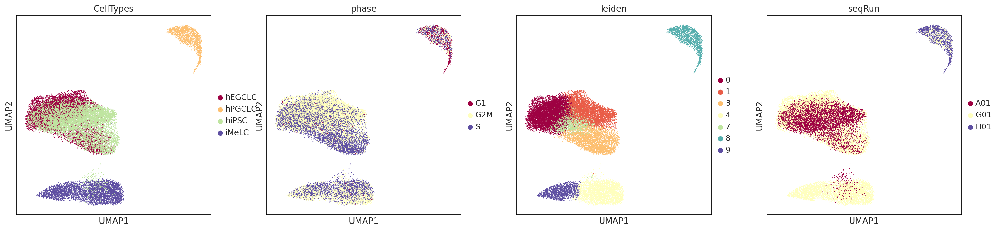

In [10]:
sc.pl.umap(adata,color=['CellTypes','phase','leiden','seqRun'],palette="Spectral")

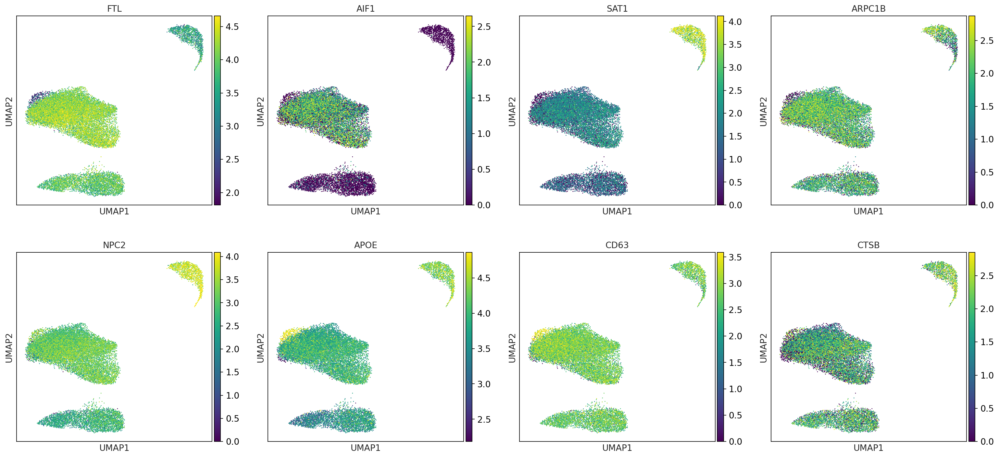

In [11]:
sc.pl.umap(adata,color=['FTL','AIF1','SAT1','ARPC1B','NPC2','APOE','CD63','CTSB'],use_raw=False,vmin="p1",vmax="p99")

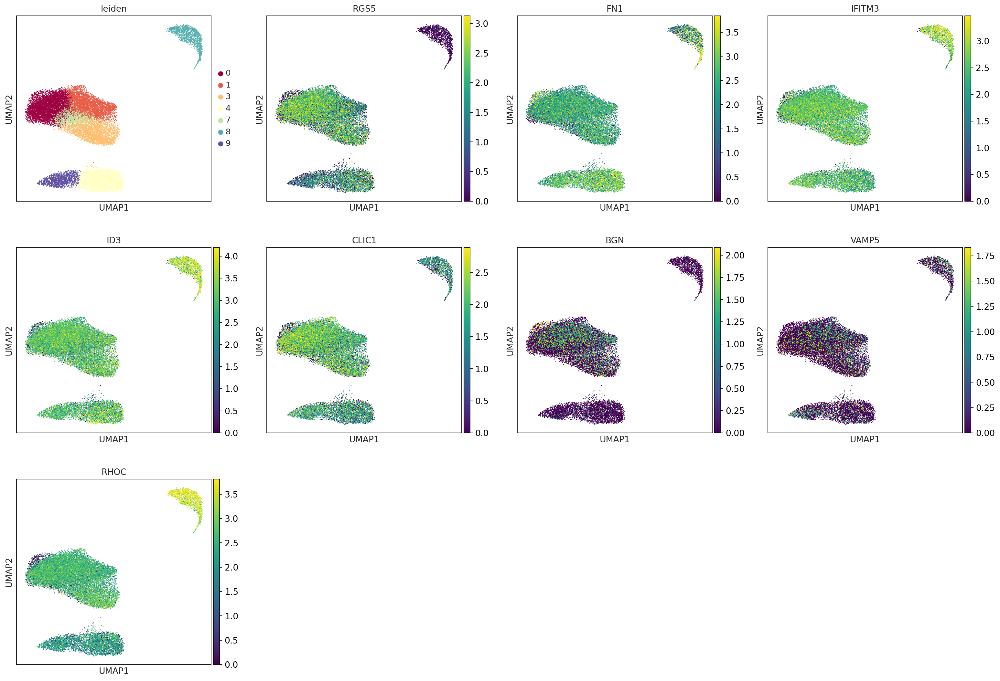

In [12]:
sc.pl.umap(adata,color=['leiden','RGS5','FN1','IFITM3','ID3','CLIC1','BGN','VAMP5','RHOC'],use_raw=False,vmin="p1",vmax="p99")

In [13]:
adata.layers['raw']

<19638x14582 sparse matrix of type '<class 'numpy.float32'>'
	with 123366748 stored elements in Compressed Sparse Row format>

In [14]:
adata.raw = ad.AnnData(adata.layers['raw'])

In [15]:
adata.raw.var.index = adata.var.index.copy()

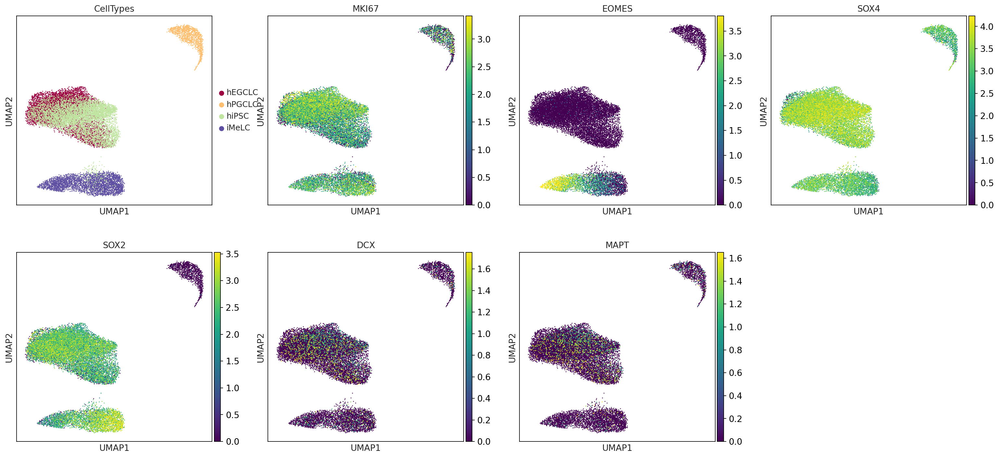

In [16]:
sc.pl.umap(adata,color=["CellTypes",'MKI67','EOMES','SOX4','SOX2','DCX','MAPT'],vmin="p1",vmax="p99",use_raw=False)

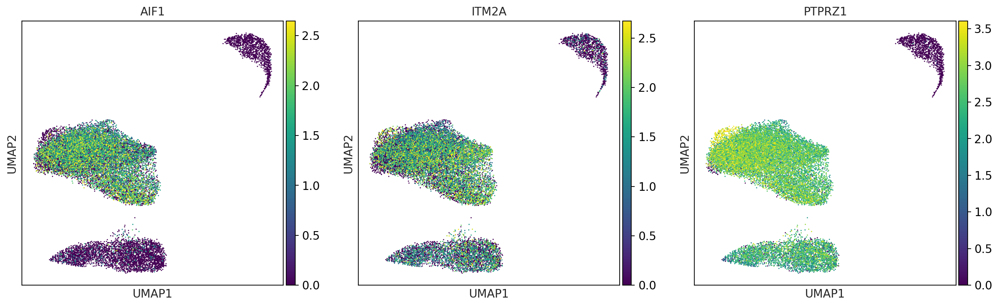

In [17]:
sc.pl.umap(adata,color=["AIF1",'ITM2A','PTPRZ1'],use_raw=False,vmin="p1",vmax="p99")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 3, etc.
var_group_labels: pericyte, microglia, endothelial, etc.


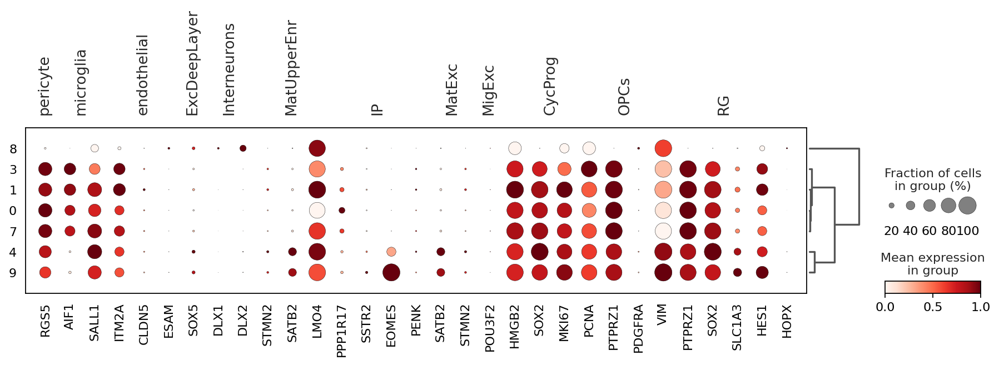

In [18]:
geschwind_ext = {
  'pericyte' : ['RGS5'],
  'microglia' : ['AIF1','SALL1'],
  'endothelial' : ['ITM2A','CLDN5','ESAM'],
  'ExcDeepLayer' : ['SOX5'],
  'Interneurons' : ['DLX1','DLX2'],
  'MatUpperEnr' : ['STMN2','SATB2','LMO4'],
  'IP' : ['PPP1R17','SSTR2','EOMES','PENK'],
  'MatExc' : ['SATB2','STMN2'],
  'MigExc' : ['POU3F2'],
  'CycProg' : ['HMGB2','SOX2','MKI67','PCNA'],
  'OPCs' : ['PTPRZ1','PDGFRA'],
  'RG' : ['VIM','PTPRZ1','SOX2','SLC1A3','HES1','HOPX'],
 }
sc.tl.dendrogram(adata,"leiden")

sc.pl.dotplot(adata, geschwind_ext,groupby="leiden",use_raw=False,log=True,standard_scale='var',dendrogram=True)

In [19]:
adata

AnnData object with n_obs × n_vars = 19638 × 14582
    obs: 'sample_id', 'run_id', 'probe_barcode_ids', 'subject', 'line', 'specimen', 'stage', 'condition', 'notes', 'seqRun', 'original_name', 'project', 'who', 'SC_derivation', 'micoplasma', 'mosaic', 'genSite', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'gene_UMI_ratio', 'log1p_gene_UMI_ratio', 'scDblFinder_score', 'scDblFinder_class', 'n_counts', 'n_genes', 'leiden', 'CellTypes', 'CellTypes_v2', 'S_score', 'G2M_score', 'phase'
    var: 'n_cells', 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'triku_distance', 'triku_distance_uncorrected', 'triku_highl

In [20]:
import gc
gc.collect()

158770

In [22]:
sc.tl.draw_graph(adata, layout='fr')

drawing single-cell graph using layout 'fr'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:06:53)


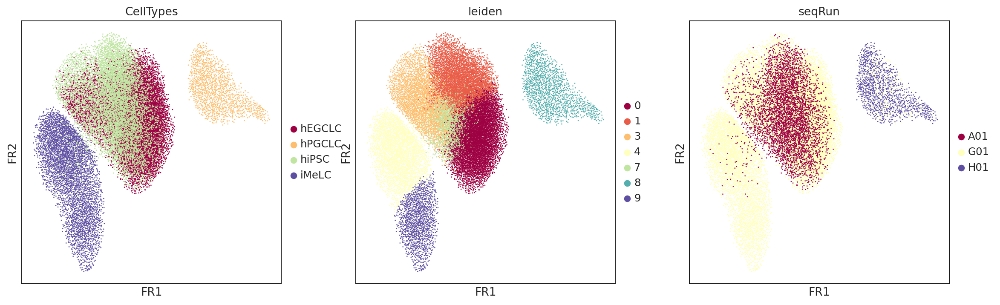

In [23]:
sc.pl.draw_graph(adata,color=['CellTypes','leiden','seqRun'],use_raw=False,vmin="p1",vmax="p99")

In [24]:
adata.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, 'CellTypes', method='wilcoxon',key_added = "wilcoxon",use_raw=False)

ranking genes
    consider 'CellTypes' groups:
    with sizes: [7733 1284 6900 3721]
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:37)


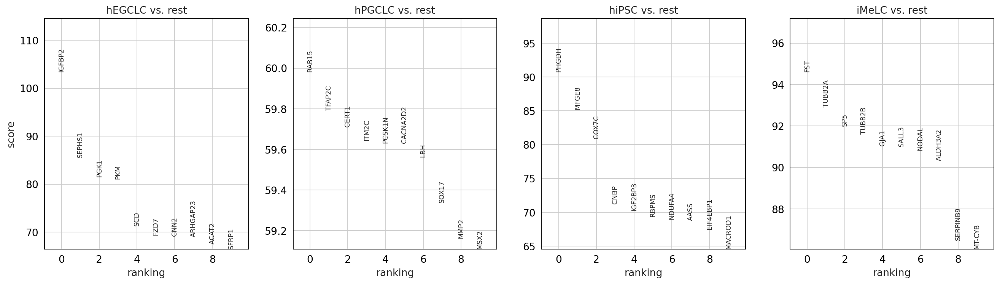

In [25]:
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, key = "wilcoxon")

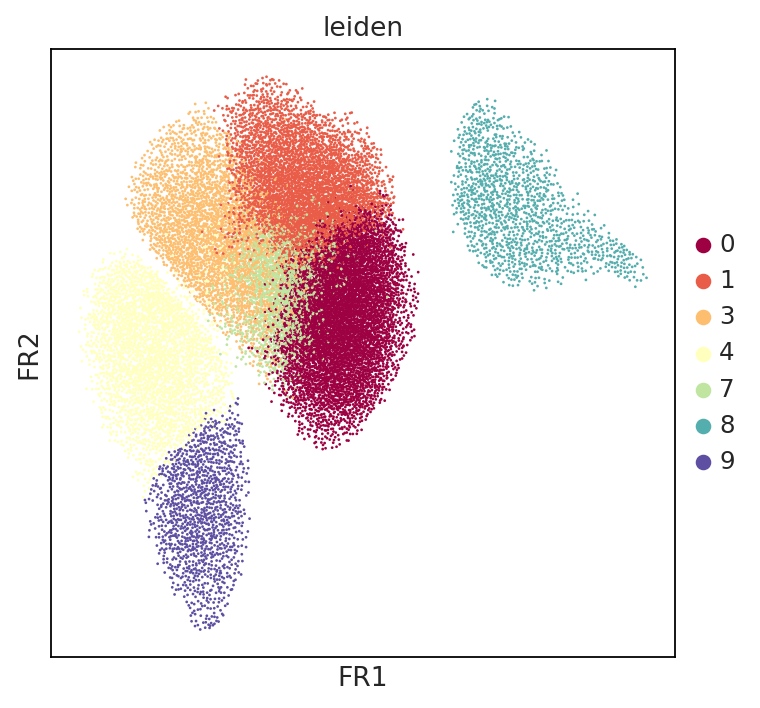

In [26]:
sc.pl.draw_graph(adata,color="leiden")

In [27]:
expressedGenes = adata.var_names.to_list()

In [28]:
adata.obs.CellTypes.value_counts()

hEGCLC    7733
hiPSC     6900
iMeLC     3721
hPGCLC    1284
Name: CellTypes, dtype: int64

In [29]:
adata.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, groupby="CellTypes", use_raw=False)

df_hEGCLC = sc.get.rank_genes_groups_df(adata, group="hEGCLC")
df_hiPSC = sc.get.rank_genes_groups_df(adata, group="hiPSC")
df_iMeLC = sc.get.rank_genes_groups_df(adata, group="iMeLC")
df_hPGCLC = sc.get.rank_genes_groups_df(adata, group="hPGCLC")


ranking genes
    consider 'CellTypes' groups:
    with sizes: [7733 1284 6900 3721]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [30]:
df_hEGCLC[:999]['names'].to_csv("2024_05_06_revised.CellTypes.hEGCLC.top1K.genes",index=False)
df_hiPSC[:999]['names'].to_csv("2024_05_06_revised.CellTypes.hiPSC.top1K.genes",index=False)
df_iMeLC[:999]['names'].to_csv("2024_05_06_revised.CellTypes.iMeLC.top1K.genes",index=False)
df_hPGCLC[:999]['names'].to_csv("2024_05_06_revised.CellTypes.hPGCLC.top1K.genes",index=False)


In [31]:
import csv

file = open('2024_05_06_revised.CellTypes.expressed.csv', 'w+', newline ='')
 
# writing the data into the file
with file:    
    write = csv.writer(file)
    write.writerows(expressedGenes)

In [32]:
sc.tl.diffmap(adata)

computing Diffusion Maps using n_comps=15(=n_dcs)
        initialized `.distances` `.connectivities` 
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         1.         0.9951552  0.9837343  0.97731847 0.963524
     0.9476762  0.9231292  0.91959697 0.9087406  0.9004161  0.8859628
     0.8770781  0.87465405 0.8728863 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:01)


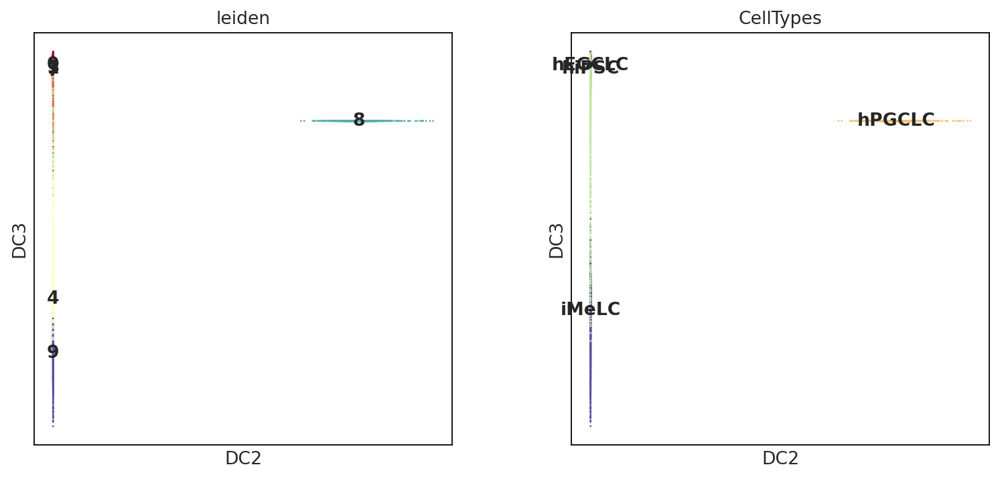

In [33]:
sc.pl.diffmap(adata,dimensions=(1,2),color=["leiden",'CellTypes'],legend_loc="on data")

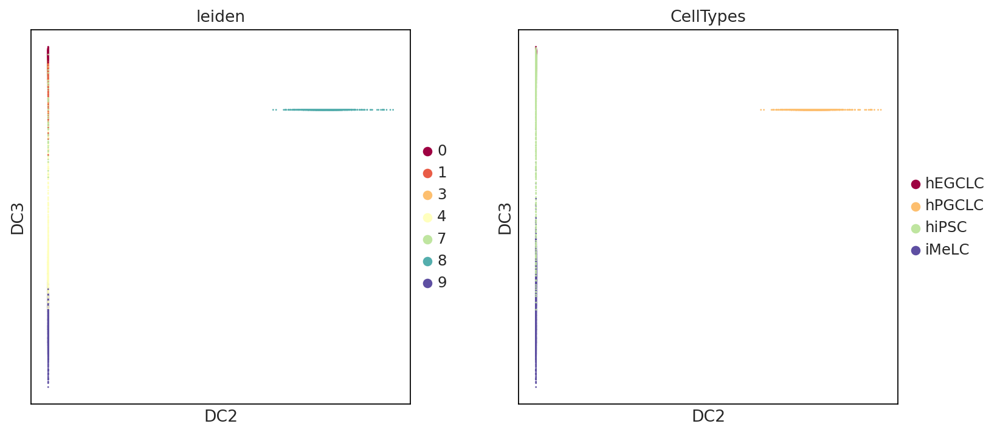

In [34]:
sc.pl.diffmap(adata,dimensions=(1,2),color=["leiden",'CellTypes'])

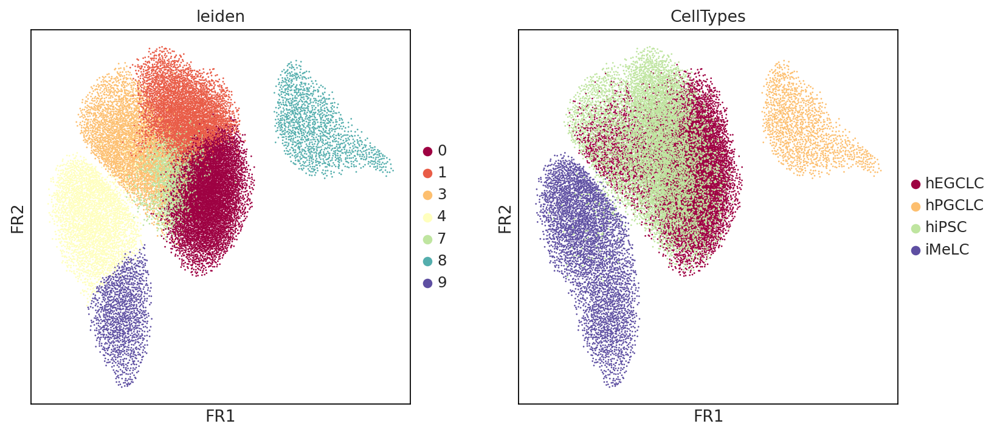

In [35]:
sc.pl.draw_graph(adata,color=["leiden",'CellTypes'])

{'main': ['hiPSC', 'iMELC', 'hPGCLC', 'hEGCLC']}

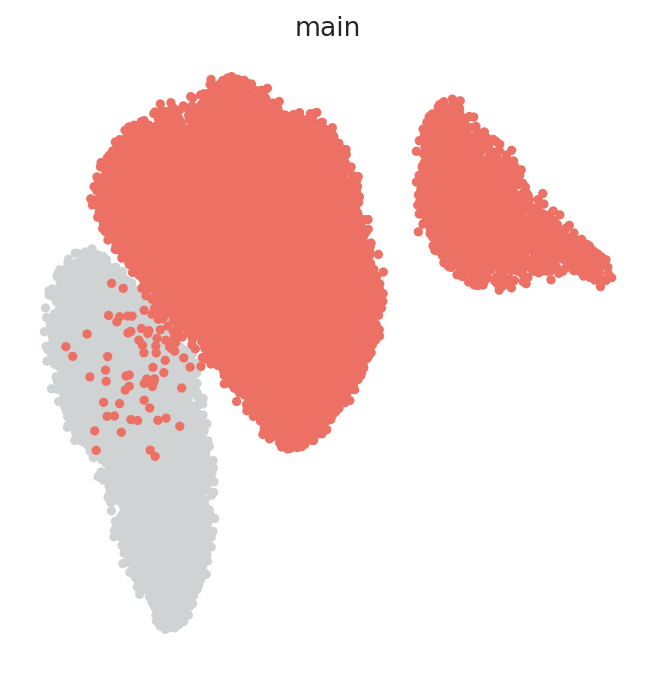

Clustering name:  CellTypes
Cluster list ['hEGCLC', 'hPGCLC', 'hiPSC', 'iMeLC']


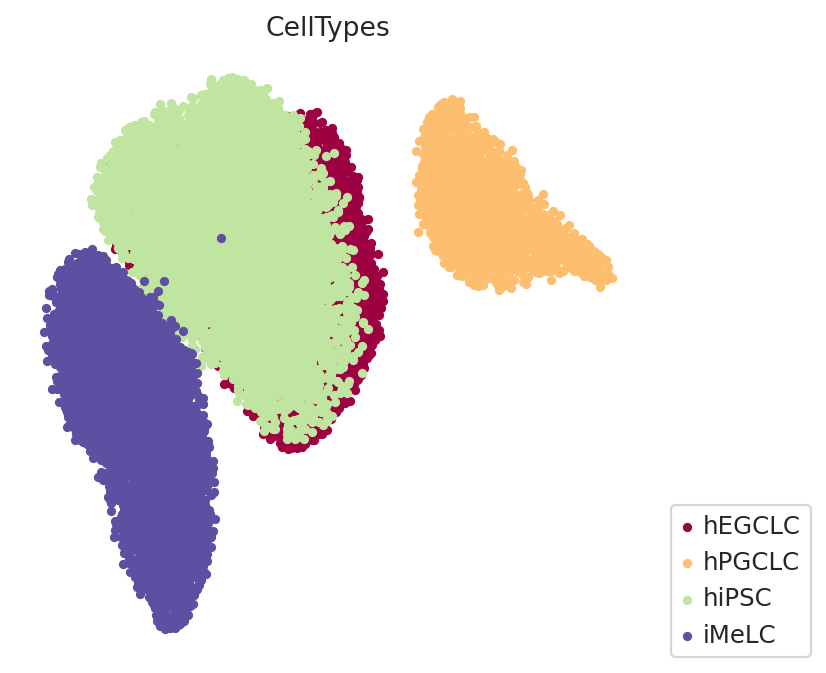

In [36]:
pt = Pseudotime_calculator(adata=adata,
                           obsm_key="X_draw_graph_fr", # Dimensional reduction data name
                           cluster_column_name="CellTypes" # Clustering data name
                           )


# Define lineages 
main = ['hiPSC','iMELC','hPGCLC','hEGCLC']


# Make a dictionary
lineage_dictionary = {"main": main}
lineage_dictionary

# Input lineage information into pseudotime object
pt.set_lineage(lineage_dictionary=lineage_dictionary)

# Visualize lineage information
pt.plot_lineages()

print("Clustering name: ", pt.cluster_column_name)
print("Cluster list", pt.cluster_list)
pt.plot_cluster(fontsize=11)

import plotly.express as px
def plot(adata, embedding_key, cluster_column_name):
    embedding = adata.obsm[embedding_key]
    df = pd.DataFrame(embedding, columns=["x", "y"])
    df["cluster"] = adata.obs[cluster_column_name].values
    df["label"] = adata.obs.index.values
    fig = px.scatter(df, x="x", y="y", hover_name=df["label"], color="cluster")
    fig.show()

plot(adata=pt.adata,
     embedding_key=pt.obsm_key,
     cluster_column_name=pt.cluster_column_name)

'991101'

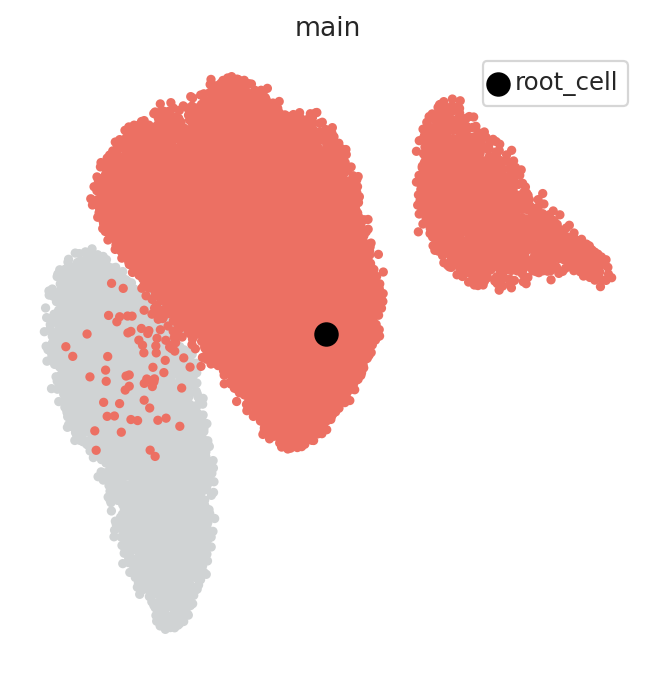

True

        initialized `.distances` `.connectivities` `.eigen_values` `.eigen_basis` `.distances_dpt`
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


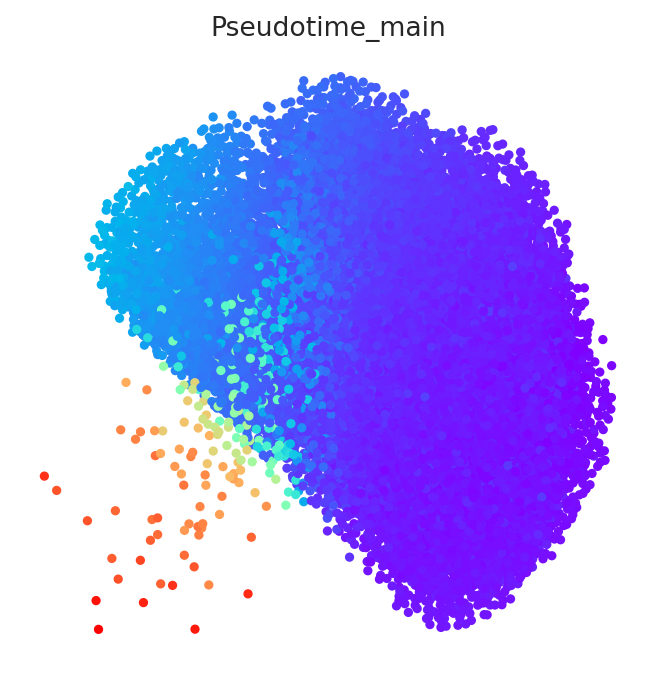

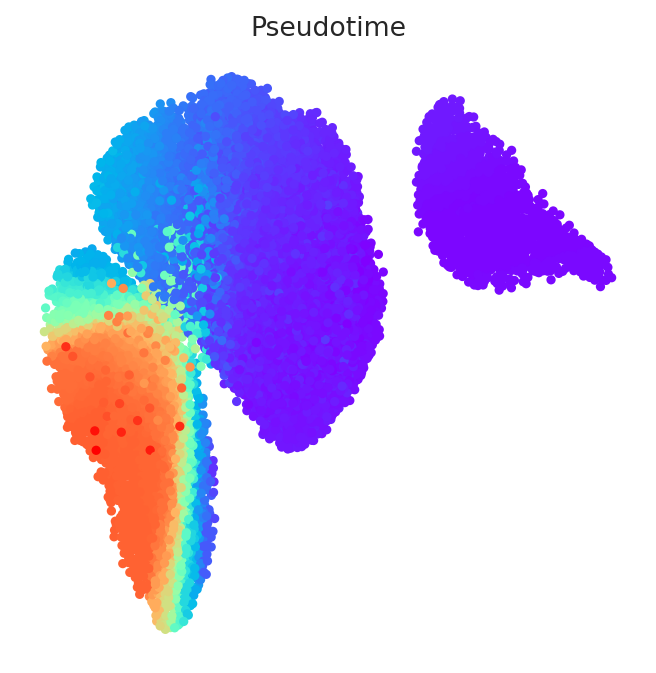

,Pseudotime
89838,0.011877
89839,0.011074
89856,0.010934
89860,0.017126
89864,0.011264


In [37]:
adata.obs_names[adata[:,'MKI67'].X.argmax()] 

root_cells = {"main": adata.obs_names[adata[:,'MKI67'].X.argmax()]}
pt.set_root_cells(root_cells=root_cells)

pt.plot_root_cells()


# check diffusion map
"X_diffmap" in pt.adata.obsm

# Calculate pseudotime
pt.get_pseudotime_per_each_lineage()

# Check results
pt.plot_pseudotime(cmap="rainbow")

# Check result
pt.adata.obs[["Pseudotime"]].head()

adata.obs = pt.adata.obs

# Save updated anndata object
adata.write_h5ad("PostPseudoTimeFull.h5ad")